# Build Networks from Articles Datasets

## Setup

In [1]:
import numpy as np
import pandas as pd

In [2]:
from scipy.stats import pearsonr

In [3]:
import networkx as nx
from networkx.algorithms import community

In [4]:
import matplotlib
import matplotlib.pyplot as plt
plt.style.use("seaborn")

from IPython.display import set_matplotlib_formats
%matplotlib inline
set_matplotlib_formats("svg")

from scipy.cluster.hierarchy import dendrogram

In [5]:
import tqdm
import json

In [6]:
import tldextract

In [7]:
def url_to_domain(url):
    domain = tldextract.extract(url)
    domain = domain.domain + "." + domain.suffix
    return domain

In [8]:
def normalize_url(url):
    url = url.split("?")[0]
    url = url.split("://")[-1] if url[:4] == "http" else url
    if not url: return None
    url = url[:-1] if url[-1] == "/" else url
    return url

In [9]:
def parselist(s):
    s = s[2:-2]
    s = s.split("', '")
    return s

## Load Data

In [10]:
articles_data_1 = pd.read_csv("../data/articles_collect/aylien_covid_articles_content_selected_1.csv")
articles_data_2 = pd.read_csv("../data/articles_collect/aylien_covid_articles_content_selected_2.csv")
articles_data_3 = pd.read_csv("../data/articles_collect/coaid_covid_articles_content.csv")

In [11]:
articles_data = pd.concat([articles_data_1, articles_data_2, articles_data_3])
articles_data = articles_data.drop_duplicates(subset=["url"])
articles_data = articles_data.reset_index(drop=True)

In [12]:
len(articles_data)

63813

In [13]:
tweetdata = pd.read_csv("../datasets/covid19_tweets.csv")
with open("../data/twitter/tweet_linkurls_expanded.json", "r") as f:
    twitter_links_data = json.load(f)

## Select Nodes

In [16]:
articles_data[articles_data.domain == "apple.com"].title.tolist()

['Apple awards $10 million from Advanced Manufacturing Fund to COPAN Diagnostics',
 'Apple makes mobility data available to aid COVID-19 efforts',
 'Future forward: The 40-year mission of an Apple Distinguished Educator',
 'Apple teams up with HBCUs to bring coding and creativity opportunities to communities across the US',
 'Apple expands iPhone repair services to hundreds of new locations across the US',
 'Apple’s WWDC20 Swift Student Challenge winners determined to shape the future']

In [17]:
articles_data[articles_data.domain == "google.com"].title.tolist()

['US biotech firm donating 1.5 million doses of experimental coronavirus drug',
 'Coronavirus Live Updates: Trump Warns of ‘a Lot of Death’ as Toll Tops 8,000 and Cases Surge Past 300,000',
 '‘There will be death’: Trump warns of ‘toughest week’ ahead',
 'Coronavirus in Illinois updates: State passes 10,000 known cases of COVID-19, with 1,453 new known cases and 33 additional deaths',
 'Spain behind U.S. in total number of coronavirus cases',
 'There are fears a coronavirus crisis looms in Tokyo. Is it too late to change course?',
 "Gov. Andrew Cuomo addresses latest with COVID-19's effect on New York | USA TODAY",
 'Peru enforcing lockdown by gender to curb coronavirus spread',
 "New York governor says virus is spreading like 'slow-moving hurricane' across US. More than 6,000 are dead",
 'Trump again tests negative for coronavirus',
 'Coronavirus cases top 1 million worldwide, researchers say',
 "States Consider Whether Religious Services Qualify As 'Essential'",
 'Streamers calling o

In [19]:
domains = sorted(list(set(articles_data.domain.tolist())))
domains = domains
print(domains)
print(f"n domains: {len(domains)}")

['acs.org', 'androidcentral.com', 'aol.com', 'apa.org', 'apnews.com', 'apple.com', 'aptv.org', 'archdaily.com', 'archive.org', 'arizona.edu', 'avclub.com', 'azcentral.com', 'bgr.com', 'billboard.com', 'bizjournals.com', 'bloomberg.com', 'breitbart.com', 'brobible.com', 'buffalonews.com', 'businessinsider.com', 'bustle.com', 'buzzfeed.com', 'buzzorange.com', 'c-span.org', 'ca.gov', 'cbslocal.com', 'cbsnews.com', 'cbssports.com', 'cdc.gov', 'chicagotribune.com', 'chron.com', 'cisco.com', 'cnbc.com', 'cnet.com', 'cnn.com', 'complex.com', 'cool3c.com', 'cosmopolitan.com', 'cuny.edu', 'dailycaller.com', 'deadline.com', 'delta.com', 'denverpost.com', 'digitaltrends.com', 'ed.gov', 'eonline.com', 'epochtimes.com', 'ew.com', 'fastcompany.com', 'fivethirtyeight.com', 'forbes.com', 'foxbusiness.com', 'foxnews.com', 'go.com', 'google.com', 'gsmarena.com', 'harvard.edu', 'hbr.org', 'healthline.com', 'hindawi.com', 'huffingtonpost.com', 'informationisbeautiful.net', 'intel.com', 'investopedia.com',

In [20]:
articles_per_domain = {d: 0 for d in domains}
for i, row in tqdm.tqdm(articles_data.iterrows(), total=len(articles_data)):
    articles_per_domain[row.domain] += 1

100%|██████████| 63813/63813 [00:05<00:00, 11575.00it/s]


In [21]:
nolink_ind = [i for i,l in enumerate(articles_data.links) if l == "[]"]
nolink_domains = articles_data.domain[nolink_ind].tolist()

In [22]:
proportion_nolink_bydomain = {d: (nolink_domains.count(d)/articles_per_domain[d]) if articles_per_domain[d] != 0 else 1.0 for d in domains}

In [23]:
baddomains = {k:v for k,v in proportion_nolink_bydomain.items() if v > 0.6}
baddomains_list = list(baddomains.keys())
baddomains

{'apa.org': 1.0,
 'bizjournals.com': 1.0,
 'bloomberg.com': 0.998109640831758,
 'hindawi.com': 1.0,
 'huffingtonpost.com': 1.0,
 'latimes.com': 1.0,
 'newsweek.com': 1.0,
 'princeton.edu': 1.0,
 'texas.gov': 1.0,
 'thewheelerreport.com': 1.0,
 'weather.gov': 1.0}

In [24]:
exclude_domains = []

In [25]:
domains = [d for d in domains if d not in baddomains_list]
domains = [d for d in domains if d not in exclude_domains]

## Social Media Data Processing

In [26]:
tweetdata["links"] = [twitter_links_data[str(i)] if str(i) in twitter_links_data else [] for i in range(len(tweetdata))]

In [27]:
twitter_all_links = [u for l in twitter_links_data.values() for u in l]
twitter_all_domains = [url_to_domain(url) for url in twitter_all_links]

In [28]:
tweet_domains = sorted(list(set(twitter_all_domains)))
print(tweet_domains)

['000webhostapp.com', '100daysinappalachia.com', '10news.com', '10tv.com', '112.international', '11alive.com', '11xi.in', '123telugu.com', '12news.com', '14850.com', '15minutefun.com', '1xbet.com', '247nnu.com', '311institute.com', '360hausa.com.ng', '360naijahits.com.ng', '360services2020.com', '365cleaners.com.au', '3dcftas.eu', '3dheals.com', '3downnation.com', '3meds.com', '3sixtyislam.com', '42gears.com', '4kingslots.com', '50plus-today.com', '573.jp', '660citynews.com', '666jams.com', '680news.com', '6abc.com', '7educon.com', '7news.com.au', '845show.com', '949whom.com', '9healthfair.org', '9news.com.au', 'aabgu.org', 'aad.org', 'aap.org', 'aappublications.org', 'aapsonline.org', 'aarp.org', 'aawsat.com', 'abc.net.au', 'abc13.com', 'abc30.com', 'abc7.com', 'abc7chicago.com', 'abc7news.com', 'abc7ny.com', 'abebooks.com', 'ablesim.com', 'aboutislam.net', 'abpaonline.org', 'abplive.com', 'abqjournal.com', 'abrbuzz.co.za', 'abs-cbn.com', 'abujascout.com', 'abundanceandhealth.co.uk', 

In [29]:
tweet_counts = {d: twitter_all_domains.count(d) for d in domains}
print(tweet_counts)

{'acs.org': 0, 'androidcentral.com': 0, 'aol.com': 10, 'apnews.com': 32, 'apple.com': 18, 'aptv.org': 0, 'archdaily.com': 0, 'archive.org': 2, 'arizona.edu': 2, 'avclub.com': 0, 'azcentral.com': 1, 'bgr.com': 8, 'billboard.com': 0, 'breitbart.com': 8, 'brobible.com': 2, 'buffalonews.com': 2, 'businessinsider.com': 21, 'bustle.com': 0, 'buzzfeed.com': 2, 'buzzorange.com': 0, 'c-span.org': 0, 'ca.gov': 4, 'cbslocal.com': 15, 'cbsnews.com': 39, 'cbssports.com': 0, 'cdc.gov': 45, 'chicagotribune.com': 4, 'chron.com': 0, 'cisco.com': 5, 'cnbc.com': 47, 'cnet.com': 5, 'cnn.com': 186, 'complex.com': 0, 'cool3c.com': 0, 'cosmopolitan.com': 0, 'cuny.edu': 0, 'dailycaller.com': 1, 'deadline.com': 3, 'delta.com': 0, 'denverpost.com': 1, 'digitaltrends.com': 1, 'ed.gov': 1, 'eonline.com': 0, 'epochtimes.com': 0, 'ew.com': 1, 'fastcompany.com': 24, 'fivethirtyeight.com': 1, 'forbes.com': 93, 'foxbusiness.com': 11, 'foxnews.com': 25, 'go.com': 32, 'google.com': 43, 'gsmarena.com': 0, 'harvard.edu': 

In [30]:
facebook_counts = {d: 0 for d in domains}
for i,row in tqdm.tqdm(articles_data.iterrows(), total=len(articles_data)):
    domain = row.domain
    if domain not in facebook_counts:
        continue
    c = row.shares_facebook
    if c > 0:
        facebook_counts[domain] += c

100%|██████████| 63813/63813 [00:06<00:00, 10453.62it/s]


In [31]:
print(facebook_counts)

{'acs.org': 1871, 'androidcentral.com': 3260, 'aol.com': 1798118, 'apnews.com': 572958, 'apple.com': 4368, 'aptv.org': 0, 'archdaily.com': 4321, 'archive.org': 485, 'arizona.edu': 2222, 'avclub.com': 379043, 'azcentral.com': 0, 'bgr.com': 46720, 'billboard.com': 64338, 'breitbart.com': 1219491, 'brobible.com': 8, 'buffalonews.com': 0, 'businessinsider.com': 2448105, 'bustle.com': 66282, 'buzzfeed.com': 7214619, 'buzzorange.com': 5460, 'c-span.org': 0, 'ca.gov': 2279, 'cbslocal.com': 354305, 'cbsnews.com': 4606603, 'cbssports.com': 296094, 'cdc.gov': 24785, 'chicagotribune.com': 320918, 'chron.com': 317356, 'cisco.com': 0, 'cnbc.com': 3745595, 'cnet.com': 808075, 'cnn.com': 5844010, 'complex.com': 1691945, 'cool3c.com': 4087, 'cosmopolitan.com': 296728, 'cuny.edu': 0, 'dailycaller.com': 3127570, 'deadline.com': 576071, 'delta.com': 145479, 'denverpost.com': 262351, 'digitaltrends.com': 31268, 'ed.gov': 977, 'eonline.com': 68171, 'epochtimes.com': 2, 'ew.com': 1769881, 'fastcompany.com':

## Network Generators

In [32]:
def generate_network_domainlevel_directlinks():
    links_by_domain_internal = {d1: {d2: 0 for d2 in domains} for d1 in domains}

    domains_set = set(domains)
    for i, row in tqdm.tqdm(articles_data.iterrows(), total=len(articles_data)):
        domain = row.domain
        if domain not in domains_set:
            continue

        links = parselist(row.links)
        links = [url_to_domain(url) for url in links]
        links = [l for l in links if l in domains_set]

        for l in links:
            links_by_domain_internal[domain][l] += 1

    links_by_domain_internal_normalized = {d: {k:(v/articles_per_domain[d]) if (articles_per_domain[d] != 0) else v for k,v in links_by_domain_internal[d].items()} for d in domains}
    
    G = nx.DiGraph()
    G.add_nodes_from(domains)
    
    for v1 in domains:
        outgoing = links_by_domain_internal[v1]
        for v2 in domains:
            w = outgoing[v2]
            if w > 0:
                G.add_edge(v1, v2, weight=w)
                
    for d in domains:
        G.nodes[d]["shares_twitter"] = tweet_counts[d]
        G.nodes[d]["shares_facebook"] = facebook_counts[d]

    return G

## Generated Networks

In [33]:
graph = generate_network_domainlevel_directlinks()

100%|██████████| 63813/63813 [00:23<00:00, 2686.88it/s]


In [34]:
graph_undirected = nx.Graph(graph)

In [66]:
nx.draw(graph, node_size=30, width=0.2, with_labels=False, font_size=6)

In [62]:
graph_vis = graph.copy()

exclude_nodes_vis = ["nysenate.gov", "nj.com"]
for v in exclude_nodes_vis:
    graph_vis.remove_node(v)

nx.draw(graph_vis, node_size=30, width=0.2, with_labels=False, font_size=5)

plt.savefig("figures/domainnetwork_3.pdf", bbox_inches="tight")
plt.show()

In [67]:
nx.draw_random(graph, node_size=30, width=0.2, with_labels=False, font_size=6)

In [323]:
print(graph.number_of_nodes())
print(graph.number_of_edges())

143
4821


In [54]:
nx.density(graph)

0.23741751206539938

In [320]:
nx.degree_assortativity_coefficient(graph)

-0.3274829479051991

In [63]:
nx.degree_assortativity_coefficient(graph, x="out", y="out")

0.05484804773300044

In [65]:
nx.degree_assortativity_coefficient(graph, x="in", y="in")

-0.09019975482700701

In [344]:
nx.attribute_assortativity_coefficient(graph, "shares_facebook")

-0.009075352253301014

In [345]:
nx.attribute_assortativity_coefficient(graph, "shares_twitter")

-0.018495510676290832

In [350]:
corr_degree_fb, _ = pearsonr([graph.degree(d) for d in domains], [graph.nodes[d]["shares_facebook"] for d in domains])
corr_indegree_fb, _ = pearsonr([graph.in_degree(d) for d in domains], [graph.nodes[d]["shares_facebook"] for d in domains])
corr_outdegree_fb, _ = pearsonr([graph.out_degree(d) for d in domains], [graph.nodes[d]["shares_facebook"] for d in domains])
print(corr_degree_fb)
print(corr_indegree_fb)
print(corr_outdegree_fb)

0.5155863812904701
0.3495940647740528
0.46059125952382335


In [351]:
corr_degree_twitter, _ = pearsonr([graph.degree(d) for d in domains], [graph.nodes[d]["shares_twitter"] for d in domains])
corr_indegree_twitter, _ = pearsonr([graph.in_degree(d) for d in domains], [graph.nodes[d]["shares_twitter"] for d in domains])
corr_outdegree_twitter, _ = pearsonr([graph.out_degree(d) for d in domains], [graph.nodes[d]["shares_twitter"] for d in domains])
print(corr_degree_twitter)
print(corr_indegree_twitter)
print(corr_outdegree_twitter)

0.14444857352492507
0.34134210948849464
-0.0795622982309172


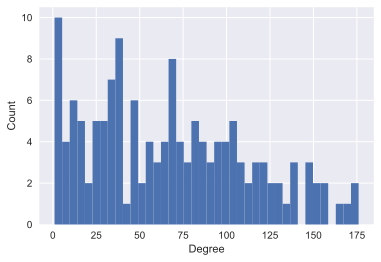

In [67]:
degrees = [graph.degree(d) for d in domains]
plt.hist(degrees, bins=40)
plt.xlabel("Degree")
plt.ylabel("Count")

plt.savefig("figures/degreedist_domainnetwork.pdf", bbox_inches="tight")
plt.show()

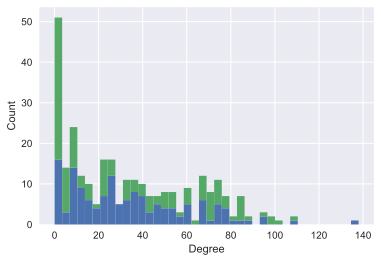

In [66]:
in_degrees = [graph.in_degree(d) for d in domains]
out_degrees = [graph.out_degree(d) for d in domains]

maxval = max(max(in_degrees), max(out_degrees))+1

b, _, _ = plt.hist(in_degrees, range=(0,maxval), bins=40)
plt.hist(out_degrees, bottom=b, range=(0,maxval), bins=40)
plt.xlabel("Degree")
plt.ylabel("Count")

plt.savefig("figures/directeddegreedist_domainnetwork.pdf", bbox_inches="tight")
plt.show()

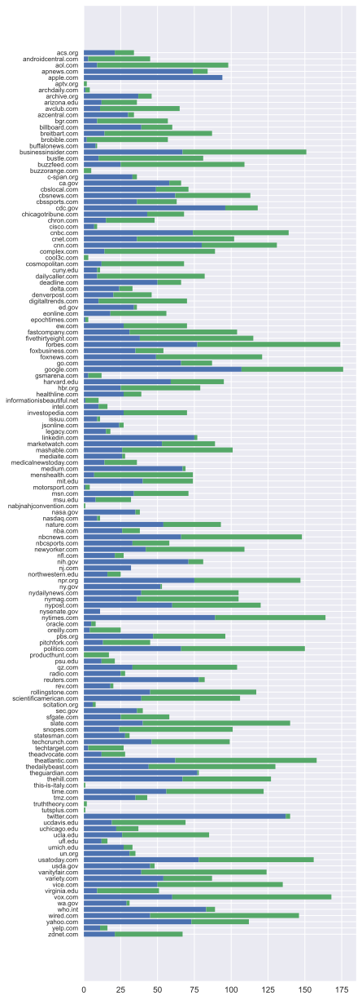

In [68]:
domains_reversed = list(reversed(sorted(domains)))

in_degrees = [graph.in_degree(d) for d in domains_reversed]
out_degrees = [graph.out_degree(d) for d in domains_reversed]

plt.figure(figsize=(6,22))

plt.barh(
    y = domains_reversed,
    width = in_degrees,
)
plt.barh(
    y = domains_reversed,
    width = out_degrees,
    left = in_degrees,
)

plt.yticks(fontsize=8)

plt.savefig("figures/degrees_domainnetwork.pdf", bbox_inches="tight")
plt.show()

In [39]:
dc = nx.centrality.in_degree_centrality(graph)
sorted(domains, key=lambda d: dc[d], reverse=True)

['twitter.com',
 'google.com',
 'cdc.gov',
 'apple.com',
 'nytimes.com',
 'who.int',
 'cnn.com',
 'reuters.com',
 'usatoday.com',
 'forbes.com',
 'theguardian.com',
 'linkedin.com',
 'npr.org',
 'apnews.com',
 'cnbc.com',
 'yahoo.com',
 'nih.gov',
 'businessinsider.com',
 'medium.com',
 'thehill.com',
 'go.com',
 'nbcnews.com',
 'politico.com',
 'cbsnews.com',
 'theatlantic.com',
 'nypost.com',
 'vox.com',
 'harvard.edu',
 'ca.gov',
 'time.com',
 'nature.com',
 'variety.com',
 'marketwatch.com',
 'ny.gov',
 'deadline.com',
 'vice.com',
 'cbslocal.com',
 'foxnews.com',
 'pbs.org',
 'techcrunch.com',
 'rollingstone.com',
 'usda.gov',
 'wired.com',
 'thedailybeast.com',
 'chicagotribune.com',
 'newyorker.com',
 'mit.edu',
 'slate.com',
 'billboard.com',
 'nydailynews.com',
 'scientificamerican.com',
 'vanityfair.com',
 'fivethirtyeight.com',
 'archive.org',
 'cbssports.com',
 'cnet.com',
 'nymag.com',
 'sec.gov',
 'foxbusiness.com',
 'nasa.gov',
 'tmz.com',
 'ed.gov',
 'msn.com',
 'c-span

In [41]:
dc = nx.centrality.out_degree_centrality(graph)
sorted(domains, key=lambda d: dc[d], reverse=True)

['vox.com',
 'wired.com',
 'slate.com',
 'forbes.com',
 'theatlantic.com',
 'aol.com',
 'thedailybeast.com',
 'vanityfair.com',
 'vice.com',
 'businessinsider.com',
 'buzzfeed.com',
 'politico.com',
 'nbcnews.com',
 'usatoday.com',
 'fivethirtyeight.com',
 'snopes.com',
 'complex.com',
 'mashable.com',
 'nytimes.com',
 'breitbart.com',
 'dailycaller.com',
 'fastcompany.com',
 'foxnews.com',
 'npr.org',
 'rollingstone.com',
 'bustle.com',
 'qz.com',
 'google.com',
 'nymag.com',
 'menshealth.com',
 'newyorker.com',
 'scientificamerican.com',
 'cnet.com',
 'nydailynews.com',
 'time.com',
 'cnbc.com',
 'digitaltrends.com',
 'nypost.com',
 'thehill.com',
 'ucla.edu',
 'cosmopolitan.com',
 'brobible.com',
 'avclub.com',
 'hbr.org',
 'techcrunch.com',
 'cbsnews.com',
 'cnn.com',
 'ucdavis.edu',
 'pbs.org',
 'bgr.com',
 'zdnet.com',
 'ew.com',
 'investopedia.com',
 'androidcentral.com',
 'virginia.edu',
 'nature.com',
 'yahoo.com',
 'eonline.com',
 'msn.com',
 'harvard.edu',
 'marketwatch.com'

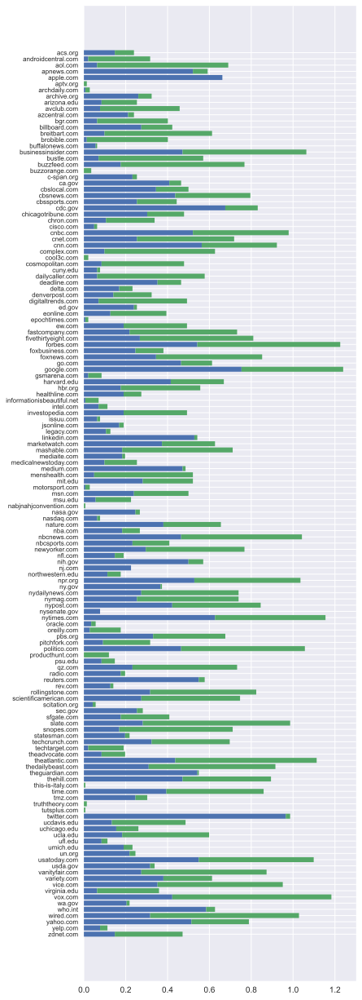

In [35]:
_domains = list(reversed(sorted(domains)))

in_centrality = nx.centrality.in_degree_centrality(graph)
out_centrality = nx.centrality.out_degree_centrality(graph)

plt.figure(figsize=(6,22))

plt.barh(
    y = _domains,
    width = [in_centrality[d] for d in _domains],
)
plt.barh(
    y = _domains,
    width = [out_centrality[d] for d in _domains],
    left = [in_centrality[d] for d in _domains],
)

plt.yticks(fontsize=8)

plt.savefig("figures/degreecentrality_domainnetwork.pdf", bbox_inches="tight")
plt.show()

In [40]:
pr = nx.pagerank(graph)
sorted(domains, key=lambda d: pr[d], reverse=True)

['twitter.com',
 'google.com',
 'medium.com',
 'theatlantic.com',
 'apple.com',
 'linkedin.com',
 'yahoo.com',
 'nytimes.com',
 'deadline.com',
 'theguardian.com',
 'politico.com',
 'cdc.gov',
 'usatoday.com',
 'nbcnews.com',
 'marketwatch.com',
 'nypost.com',
 'forbes.com',
 'cnn.com',
 'variety.com',
 'cnbc.com',
 'nih.gov',
 'rollingstone.com',
 'who.int',
 'reuters.com',
 'tmz.com',
 'legacy.com',
 'fivethirtyeight.com',
 'npr.org',
 'bgr.com',
 'nydailynews.com',
 'businessinsider.com',
 'foxnews.com',
 'go.com',
 'chicagotribune.com',
 'vox.com',
 'apnews.com',
 'cbssports.com',
 'thehill.com',
 'thedailybeast.com',
 'cbslocal.com',
 'cbsnews.com',
 'nbcsports.com',
 'issuu.com',
 'pbs.org',
 'nature.com',
 'harvard.edu',
 'ca.gov',
 'ny.gov',
 'un.org',
 'archive.org',
 'time.com',
 'sec.gov',
 'ed.gov',
 'oracle.com',
 'cnet.com',
 'nj.com',
 'zdnet.com',
 'techcrunch.com',
 'newyorker.com',
 'usda.gov',
 'nymag.com',
 'wired.com',
 'healthline.com',
 'intel.com',
 'vice.com',


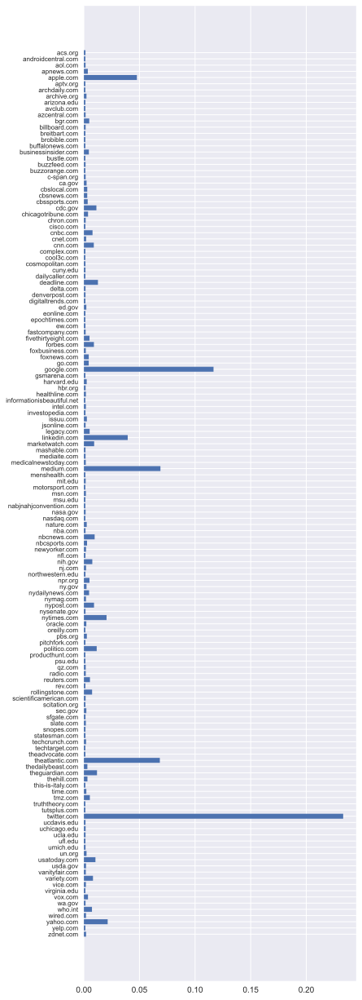

In [57]:
_domains = list(reversed(sorted(domains)))

pagerank = nx.pagerank(graph)

plt.figure(figsize=(6,22))
plt.barh(
    y = _domains,
    width = [pagerank[d] for d in _domains],
)
plt.yticks(fontsize=8)

plt.savefig("figures/pagerank_domainnetwork.pdf", bbox_inches="tight")
plt.show()

## Clustering

In [126]:
def comm_hist(x):
    c = [len(z) for z in x]
    v = list(set(c))
    q = {y:c.count(y) for y in v}
    return q

In [301]:
def compute_dendrogram(communities_list, weights=None):

    n = len(domains)
    Z = np.zeros((n-1,4), dtype=np.float)

    merged_communities = []
    prev_communities = next(communities_list)
    
    for c in prev_communities:
        merged_communities.append(c)
    
    for i, communities in enumerate(communities_list):
        merged = [c for c in prev_communities if c not in communities]
        if len(merged) != 2:
            print("ERR")
            return
        a, b = merged[0], merged[1]
        aInd = merged_communities.index(a)
        bInd = merged_communities.index(b)
        aInd, bInd = min(aInd,bInd), max(aInd,bInd)
        new_community = set.union(a,b)
        merged_communities.append(new_community)
        prev_communities = communities
        Z[i,0] = aInd
        Z[i,1] = bInd
        Z[i,3] = len(new_community)
        
    if weights is None:
        Z[:,2] = Z[:,3]
    else:
        Z[:,2] = weights

    labels = [list(c)[0] for c in merged_communities[:n]]
    
    return Z, labels

In [205]:
def girvan_newman(G):
    G = G.copy()
    connected_components = nx.algorithms.components.strongly_connected_components if (G.is_directed()) else nx.algorithms.components.connected_components
    c = [set(x) for x in connected_components(G)]
    nc = len(c)
    dend = [c]
    ws = []
    while G.number_of_edges() > 0:
        Cb = nx.algorithms.centrality.edge_betweenness_centrality(G)
        e = max(Cb.items(), key=lambda x: x[1])[0]
        G.remove_edge(*e)
        c = [set(x) for x in connected_components(G)]
        if len(c) != nc:
            nc = len(c)
            dend.append(c)
            ws.append(max(Cb.values()))
            print(nc)
    return dend, ws

In [315]:
comm_gn, ws_gn = girvan_newman(graph_undirected)

2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143


In [316]:
comm_gn_ = reversed(comm_gn)
ws_gn_ = list(reversed(ws_gn))

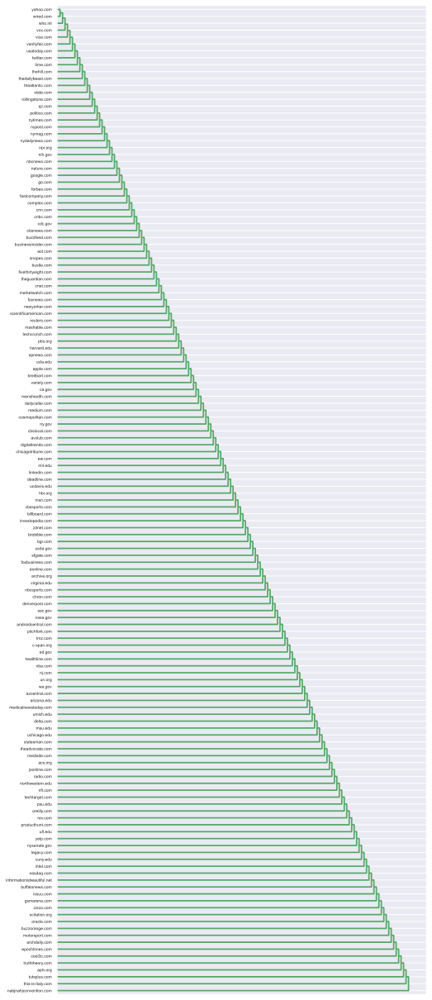

In [317]:
plt.figure(figsize=(8,22))
dend, lbls = compute_dendrogram(comm_gn_, weights=ws_gn_)
dendrogram(
    dend,
    labels=lbls,
    orientation="right",
    color_threshold=0.65,
    count_sort=True,
)
plt.xticks([])

plt.savefig("figures/dendogram_girvannewman.pdf", bbox_inches="tight")
plt.show()

[]

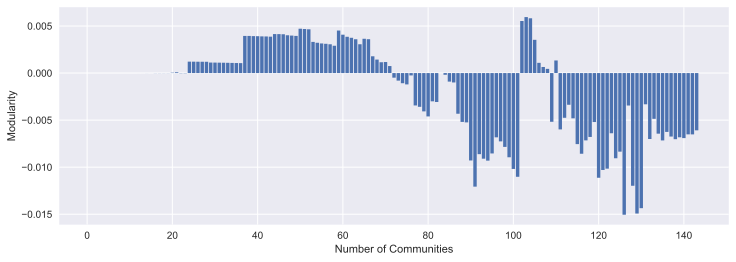

In [319]:
gn_communities = comm_gn
gn_communities_modularity = [community.modularity(graph, c) for c in gn_communities]

plt.figure(figsize=(12,4))
plt.bar(
    [len(c) for c in gn_communities],
    gn_communities_modularity,
)
plt.xlabel("Number of Communities")
plt.ylabel("Modularity")

plt.savefig("figures/modularity_girvannewman.pdf", bbox_inches="tight")
plt.plot()

In [228]:
def jaccard_sim(G, i, j):
    ni = {x for x in G.neighbors(i)}
    nj = {x for x in G.neighbors(j)}
    si = len(set.intersection(ni, nj))
    su = len(set.union(ni, nj))
    return si / su

def average_linkage(G, A, B):
    s = 0.0
    for a in A:
        for b in B:
            s += jaccard_sim(G, a, b)
    s = s / (len(A) * len(B))
    return s

def merge_communities(communities, i, j):
    communities = communities.copy()
    i,j = (i,j) if i>j else (j,i)
    a,b = communities[i], communities[j]
    del communities[i]
    del communities[j]
    communities.append(a + b)
    return communities

def ravasz(G):
    n = G.number_of_nodes()
    communities = [[n] for n in G.nodes]
    iter_list = [communities.copy()]
    ws = []
    while len(communities) > 1:
        c = len(communities)
        community_sims = np.full((c,c), -np.inf)
        for i in range(c):
            for j in range(i+1,c):
                community_sims[i,j] = average_linkage(G, communities[i], communities[j])
        i,j = np.unravel_index(community_sims.argmax(), community_sims.shape)
        communities = merge_communities(communities, i, j)
        iter_list.append(communities)
        ws.append(community_sims[i,j])
        print(c)
    return iter_list, ws

In [229]:
comm_ravasz, ws_ravasz = ravasz(graph_undirected)

143
142
141
140
139
138
137
136
135
134
133
132
131
130
129
128
127
126
125
124
123
122
121
120
119
118
117
116
115
114
113
112
111
110
109
108
107
106
105
104
103
102
101
100
99
98
97
96
95
94
93
92
91
90
89
88
87
86
85
84
83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2


In [249]:
comm_ravasz_ = [[set(c) for c in y] for y in comm_ravasz]

m1 = max(ws_ravasz)
m2 = min(ws_ravasz)
ws_ravasz_ = [m1-w+m2 for w in ws_ravasz]

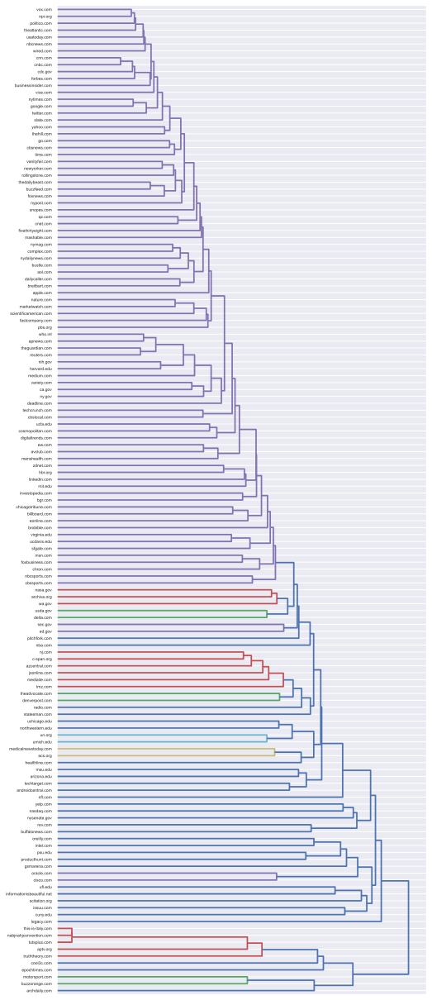

In [307]:
plt.figure(figsize=(8,22))
dend, lbls = compute_dendrogram(iter(comm_ravasz_), weights=ws_ravasz_)
dendrogram(
    dend,
    labels=lbls,
    orientation="right",
    color_threshold=0.65,
    count_sort=True,
)
plt.xticks([])

plt.savefig("figures/dendogram_ravasz.pdf", bbox_inches="tight")
plt.show()

[]

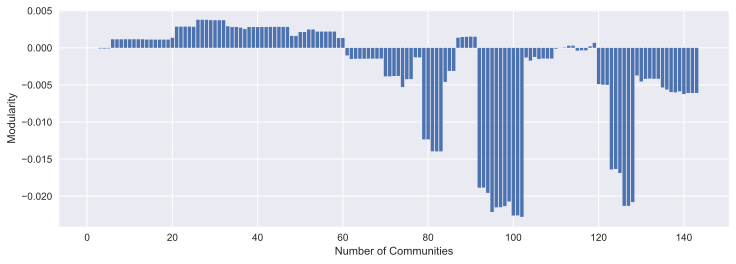

In [313]:
ravasz_communities = comm_ravasz
ravasz_communities_modularity = [community.modularity(graph, c) for c in ravasz_communities]

plt.figure(figsize=(12,4))
plt.bar(
    [len(c) for c in ravasz_communities],
    ravasz_communities_modularity,
)
plt.xlabel("Number of Communities")
plt.ylabel("Modularity")

plt.savefig("figures/modularity_ravasz.pdf", bbox_inches="tight")
plt.plot()

In [355]:
comms_opt_ind = np.argmax(ravasz_communities_modularity)
n_comms_opt = [len(c) for c in ravasz_communities][comms_opt_ind]
comms_opt = ravasz_communities[comms_opt_ind]
print(n_comms_opt)
print(comms_opt)

28
[{'archdaily.com'}, {'buffalonews.com'}, {'cool3c.com'}, {'cuny.edu'}, {'epochtimes.com'}, {'gsmarena.com'}, {'informationisbeautiful.net'}, {'intel.com'}, {'issuu.com'}, {'legacy.com'}, {'nasdaq.com'}, {'nfl.com'}, {'nysenate.gov'}, {'oreilly.com'}, {'rev.com'}, {'scitation.org'}, {'statesman.com'}, {'ufl.edu'}, {'yelp.com'}, {'motorsport.com', 'buzzorange.com'}, {'nabjnahjconvention.com', 'this-is-italy.com', 'truththeory.com', 'aptv.org', 'tutsplus.com'}, {'cisco.com', 'oracle.com'}, {'northwestern.edu', 'uchicago.edu', 'un.org', 'umich.edu'}, {'acs.org', 'healthline.com', 'medicalnewstoday.com'}, {'denverpost.com', 'theadvocate.com', 'radio.com', 'tmz.com', 'jsonline.com', 'c-span.org', 'nj.com', 'mediaite.com', 'azcentral.com'}, {'producthunt.com', 'psu.edu'}, {'msu.edu', 'techtarget.com', 'arizona.edu', 'androidcentral.com'}, {'digitaltrends.com', 'npr.org', 'rollingstone.com', 'thehill.com', 'nytimes.com', 'avclub.com', 'sfgate.com', 'cdc.gov', 'linkedin.com', 'vice.com', 'th

In [68]:
comm_greedy = community.greedy_modularity_communities(graph_undirected)
print(comm_greedy)

[frozenset({'wired.com', 'pitchfork.com', 'jsonline.com', 'scientificamerican.com', 'ucla.edu', 'marketwatch.com', 'newyorker.com', 'buzzorange.com', 'complex.com', 'pbs.org', 'arizona.edu', 'sec.gov', 'businessinsider.com', 'cbslocal.com', 'time.com', 'virginia.edu', 'investopedia.com', 'gsmarena.com', 'healthline.com', 'intel.com', 'radio.com', 'thedailybeast.com', 'delta.com', 'ucdavis.edu', 'cuny.edu', 'uchicago.edu', 'ew.com', 'who.int', 'msu.edu', 'linkedin.com', 'cnn.com', 'usda.gov', 'motorsport.com', 'apnews.com', 'nymag.com', 'rev.com', 'scitation.org', 'menshealth.com', 'deadline.com', 'qz.com', 'archive.org', 'nba.com', 'mit.edu', 'go.com', 'issuu.com', 'psu.edu', 'variety.com', 'truththeory.com', 'androidcentral.com', 'fastcompany.com', 'oreilly.com', 'google.com', 'msn.com', 'cool3c.com', 'usatoday.com', 'cnet.com', 'medium.com', 'wa.gov', 'harvard.edu', 'un.org', 'twitter.com', 'nbcsports.com', 'mediaite.com', 'avclub.com', 'billboard.com', 'nfl.com', 'foxbusiness.com', 